In [4]:
import seaborn
import sklearn
import matplotlib.pyplot as plt
seaborn.set(style='ticks')
from IPython.display import Audio
import numpy as np
import scipy
import librosa
import mir_eval
%matplotlib inline

In [6]:
y,sr=librosa.load(librosa.util.example_audio_file())

AttributeError: module 'librosa.util' has no attribute 'example_audio_file'

In [3]:
print(type(y),type(sr))

<class 'numpy.ndarray'> <class 'int'>


In [4]:
print(y.shape,sr)

(1355168,) 22050


In [5]:
Audio(data=y,rate=sr)

In [6]:
import librosa.display

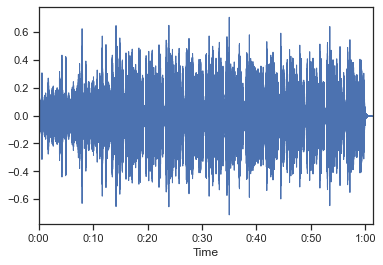

In [7]:
librosa.display.waveplot(y,sr);

### RMS ENERGY PLOT

In [8]:
librosa.feature.rms(y=y)

array([[6.6792396e-05, 1.4454446e-02, 2.9964622e-02, ..., 8.7353783e-06,
        6.9580756e-06, 3.5498315e-06]], dtype=float32)

C:\Users\PARTH\anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\Users\PARTH\anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\Users\PARTH\anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


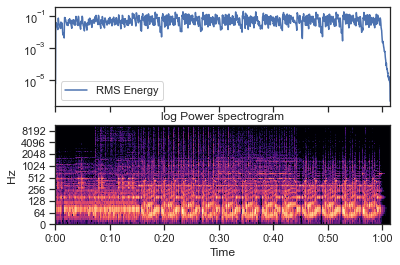

In [12]:
S, phase = librosa.magphase(librosa.stft(y))
rms = librosa.feature.rms(S=S)
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=2, sharex=True)
times = librosa.times_like(rms)
ax[0].semilogy(times, rms[0], label='RMS Energy')
ax[0].set(xticks=[])
ax[0].legend()
ax[0].label_outer()
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),y_axis='log', x_axis='time', ax=ax[1])
ax[1].set(title='log Power spectrogram')
S = librosa.magphase(librosa.stft(y, window=np.ones, center=False))[0]
librosa.feature.rms(S=S)
plt.show()

# librosa.feature.zero_crossing_rate

# Spectograms 
### Are stored as two Dimensional Numpy arrays. First axis is time and the Second Axis is frequency.

## Short time fourier transform 
#### Sampling rate (Default) = 22050
#### n_fft (Default) = 2048 (Samples Per frame)
#### Sampling rate (Default) = 22050
#### Hop_Lenght  (Samples between Frames) = 512


In [34]:
D=librosa.stft(y)

C:\Users\PARTH\AppData\Roaming\Python\Python38\site-packages\numpy\core\_asarray.py:85: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


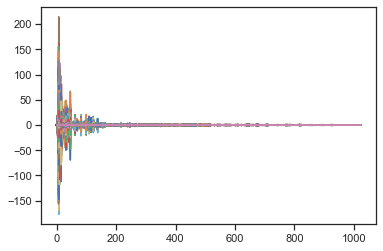

In [35]:
plt.plot(D);

In [40]:
#Taking Log Amplitude using librosa to scale down the plot
log_power=librosa.amplitude_to_db(np.abs(D**2), ref=1.0)
#librosa.amplitude_to_db(S, ref=1.0, amin=1e-05, top_db=80.0)

C:\Users\PARTH\anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\Users\PARTH\anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
C:\Users\PARTH\anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


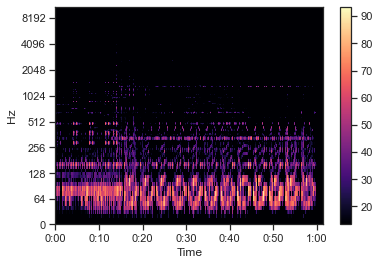

In [43]:
librosa.display.specshow(log_power, x_axis='time',y_axis='log')
plt.colorbar()

## Direct Log Frequency Analysis
### In mathematics and signal processing, the constant-Q transform, simply known as CQT transforms a data series to the frequency domain. It is a type of a wavelet transform


In [44]:
C=librosa.cqt(y,sr)

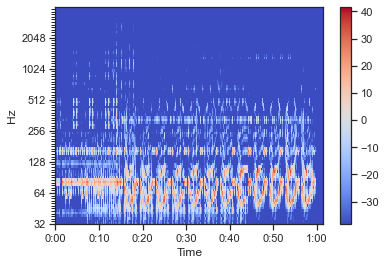

In [46]:
librosa.display.specshow(librosa.amplitude_to_db(np.abs(C**2), ref=1.0), x_axis='time',y_axis='cqt_hz')
plt.colorbar();

## Spectral Features
### Spectral features are often used to analyze harmony or timbre
### Usually a product of the spectogram and filter bank
#### In signal processing, a filter bank is an array of bandpass filters that separates the input signal into multiple components, each one carrying a single frequency sub-band of the original signal

### Spectral Centroid

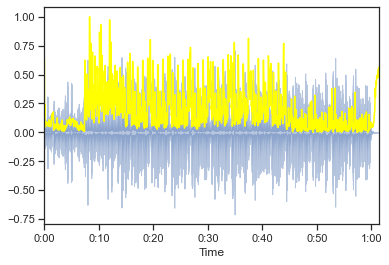

In [97]:
import sklearn
spectral_centroids = librosa.feature.spectral_centroid(y, sr=sr)[0]
spectral_centroids.shape
# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)
# Normalising the spectral centroid for visualisation
def normalize(y, axis=0):
    return sklearn.preprocessing.minmax_scale(y, axis=axis)
#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(y, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='yellow')

## Pitch Vs Pitch Class

### Pitch classes are pitches under octave equivalence that are also spelled the same.

### CQT Measures the energy in Each pitch

### Chroma measures the energy in each Pitch Class
Chroma Vector. A chroma vector is a typically a. 12-element feature vector indicating how. much energy of each pitch class, {C, C#, D, D#, E, ..., B}, is present in the signal.

In [47]:
chroma=librosa.feature.chroma_cqt(C=C, sr=sr)

C:\Users\PARTH\anaconda3\lib\site-packages\librosa\display.py:822: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  warnings.warn(


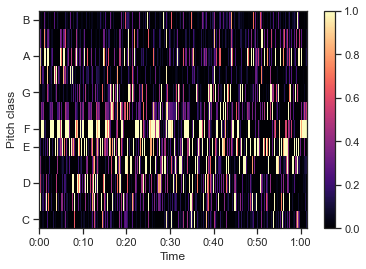

In [48]:
librosa.display.specshow(chroma, x_axis='time',y_axis='chroma')
plt.colorbar();

## Mel-frequency Spectograms

In [50]:
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)

C:\Users\PARTH\anaconda3\lib\site-packages\librosa\display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


[Text(0.5, 1.0, 'Mel-frequency spectrogram')]

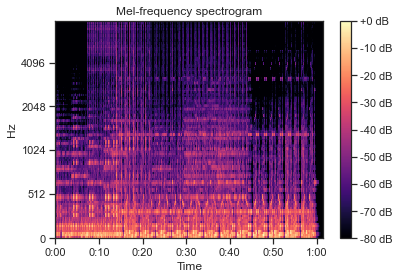

In [51]:
fig, ax = plt.subplots()
S_dB = librosa.power_to_db(S, ref=np.max)
img = librosa.display.specshow(S_dB, x_axis='time', y_axis='mel', sr=sr,fmax=8000, ax=ax)
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='Mel-frequency spectrogram')

## Mel-Frequency Cepstral Coefficients MFCC
In sound processing, the mel-frequency cepstrum (MFC) is a representation of the short-term power spectrum of a sound, based on a linear cosine transform of a log power spectrum on a nonlinear mel scale of frequency. Cepstrum is plotted on x axis as quefrency and y axis as absolute magnitude.

### Difference between pitch and MFCC
Pitch is then how the human ear hears and understands that frequency.
Mel frequency is basically perceptual frequency. 

#### The Mel-scale aims to mimic the non-linear human ear perception of sound, by being more discriminative at lower frequencies and less discriminative at higher frequencies.


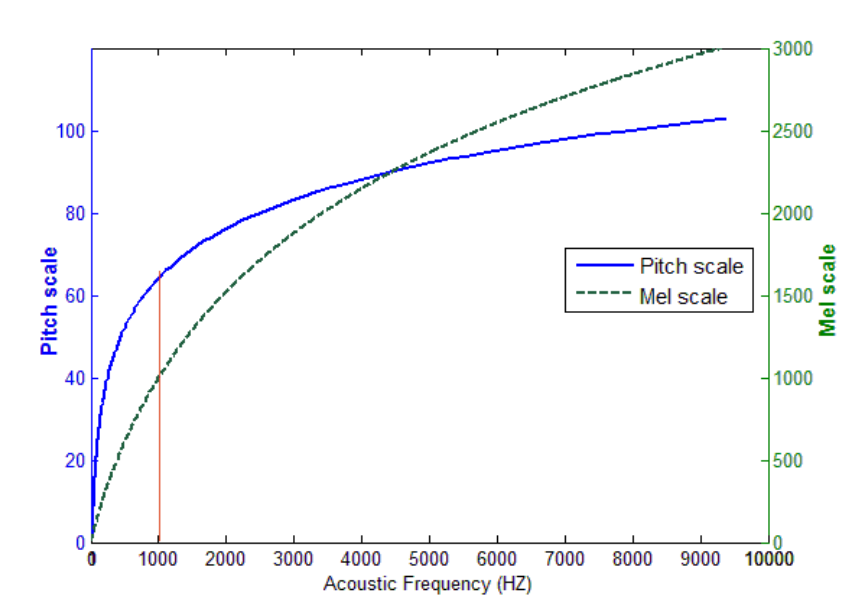

In [63]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(filename = "pitch.png", width=500)

[Text(0.5, 1.0, 'MFCC')]

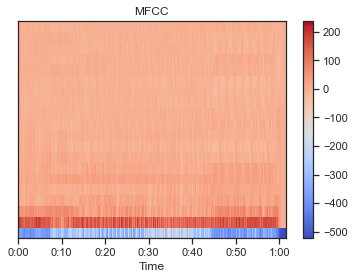

In [53]:
MFCC = librosa.feature.mfcc(y=y, sr=sr)
fig, ax = plt.subplots()
img = librosa.display.specshow(MFCC, x_axis='time', ax=ax)
fig.colorbar(img, ax=ax)
ax.set(title='MFCC')

In [68]:
print(MFCC.shape)

#In this case, mfcc computed 20 MFCCs over 2647 frames.

(20, 2647)


C:\Users\PARTH\anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\PARTH\anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


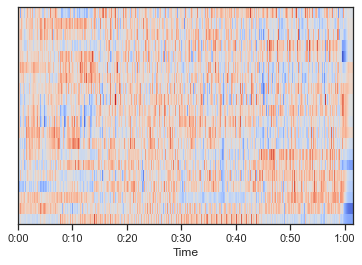

In [72]:
#MFCCs are scaled to view only the most important higher valued coefficients

mfccs = sklearn.preprocessing.scale(MFCC, axis=1)
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

In [83]:
MFCC

array([[-522.94525  , -494.4136   , -402.84222  , ..., -522.94525  ,
        -522.94525  , -522.94525  ],
       [   0.       ,   37.863792 ,  125.671684 , ...,    0.       ,
           0.       ,    0.       ],
       [   0.       ,   31.919342 ,   48.41205  , ...,    0.       ,
           0.       ,    0.       ],
       ...,
       [   0.       ,   -7.9963193,   -5.3531218, ...,    0.       ,
           0.       ,    0.       ],
       [   0.       ,   -7.5115023,   -6.033306 , ...,    0.       ,
           0.       ,    0.       ],
       [   0.       ,   -5.068611 ,   -4.628705 , ...,    0.       ,
           0.       ,    0.       ]], dtype=float32)

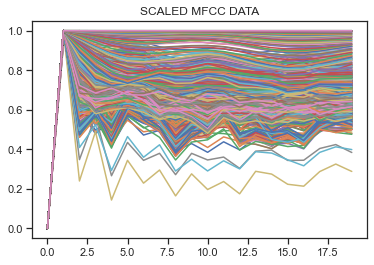

In [91]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler(feature_range=(0,1))
scaler=scaler.fit(MFCC)
mfcc_data=scaler.transform(MFCC)
plt.title("SCALED MFCC DATA")
plt.plot(mfcc_data);

## Filter Banks
The Mel scale aim to mimic non-linear human ear perception of sound. Human ears are more discriminative at lower frequencies and less discriminative at higher frequencies. Mel filter banks do exactly that by giving a better resolution at low frequencies and less at high.
Triangular filter banks help to capture the energy at each critical frequency band and roughly approximates the spectrum shape. This also helps to smooth the harmonic structure.
The Mel spaced Filter Bank as stated formally is a set of 20–40 triangular filters. 


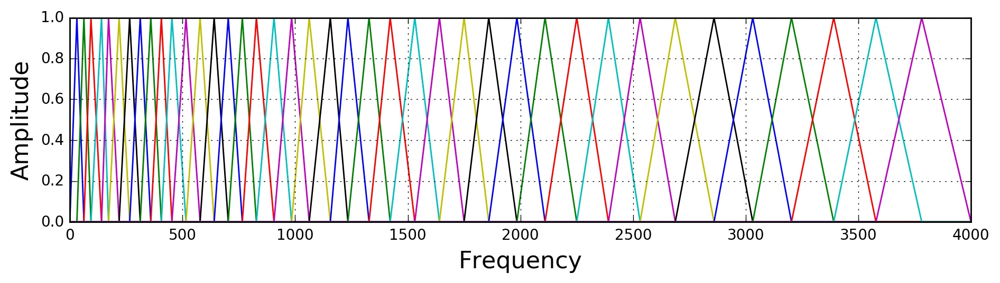

In [93]:
Image(filename = "melfilter.jpg", width=800)

## Audio Features 

#### Onset
Onset refers to the beginning of a musical note or other sound.


In [101]:
onset_envelope=librosa.onset.onset_strength(y,sr)
onsets=librosa.onset.onset_detect(onset_envelope=onset_envelope)

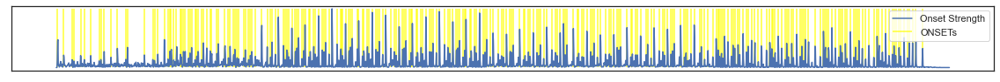

In [113]:
plt.subplot(2,1,1)
plt.plot(onset_envelope,label='Onset Strength')
plt.vlines(onsets,0,onset_envelope.max(),color='yellow',alpha=0.8,label='ONSETs')
plt.xticks([]),plt.yticks([])
plt.legend(frameon=True)

### Tempo and Beats
In musical terminology, tempo is the speed or pace of a given piece.

In [114]:
tempo, beats = librosa.beat.beat_track(y=y, sr=sr)

In [147]:
tempo

129.19921875

### Recurrence plots
Recurrence plot – A recurrence plot (RP) is an advanced technique of nonlinear data analysis. It is a visualisation (or a graph) of a square matrix, in which the matrix elements correspond to those times at which a state of a dynamical system recurs.

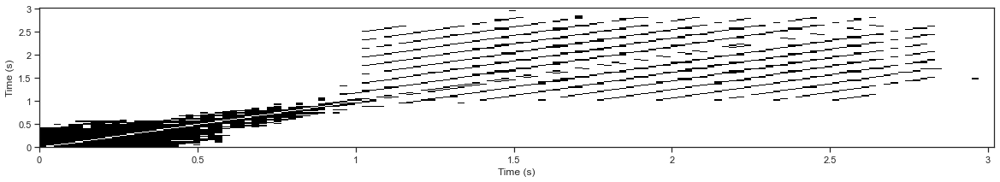

In [143]:
C = np.abs(librosa.cqt(y=y, sr=sr))
C_med = librosa.util.sync(C, beats, aggregate=np.median)
chroma_stack = librosa.feature.stack_memory(C_med, n_steps=10, delay=3)
R = librosa.segment.recurrence_matrix(chroma_stack,sym=True)
librosa.display.specshow(R,x_axis='s', y_axis='s');



### HPSS Harmonic Percussive Separation


In [5]:
import IPython.display as ipd

In [3]:
tabla_sample = r"C:\Users\PARTH\Desktop\be project\GTZAN DATASET\tabla_1_wav.wav"
guitar_sample = r"C:\Users\PARTH\Desktop\be project\GTZAN DATASET\guitar_wav.wav"
x,sr = librosa.load(tabla_sample)
y,sr1 = librosa.load(guitar_sample)


In [6]:
ipd.Audio(x,rate=sr) 

In [11]:
ipd.Audio(y,rate=sr1) 

In [7]:
data_h, data_p = librosa.effects.hpss(y)

In [8]:
ipd.Audio(data_h,rate=sr) #Harmonic

In [9]:
ipd.Audio(data_p,rate=sr) #Percussion 